In [ ]:
pip install geohash2

  Preparing metadata (setup.py) ... done
  Created wheel for geohash2: filename=geohash2-1.1-py3-none-any.whl size=15544 sha256=b6a763ccf15e727622b2a762b072ceea5d0560fce4cbaa6a55c8522672bbd6e8
  Stored in directory: /root/.cache/pip/wheels/c0/21/8d/fe65503f4f439aef35193e5ec10a14adc945e20ff87eb35895
Successfully built geohash2


In [ ]:
# Data manipulation
import pandas as pd
import numpy as np
import datetime
import time

# Preprocessing
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split

# Clustering & silhouette_score
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
from scipy.spatial.distance import jensenshannon

# Geospatial
import geopandas as gpd
from geopandas.tools import sjoin
from shapely.geometry import Point
import geohash2

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from folium.plugins import HeatMap


# Air Quality Data

In [ ]:
data = pd.read_csv("https://raw.githubusercontent.com/IsamAljawarneh/datasets/master/data/NYC_AQ.csv")
geo_json_file = gpd.read_file('https://raw.githubusercontent.com/IsamAljawarneh/datasets/master/data/nyc_polygon.geojson')

## EDA

### Data

In [ ]:
Data = pd.read_csv('https://raw.githubusercontent.com/IsamAljawarneh/datasets/master/data/NYC_AQ.csv')

In [ ]:
Data.head()

,SensorID,time,latitude,longitude,bin0,bin1,bin2,bin3,bin4,bin5,...,bin17,bin18,bin19,bin20,bin21,bin22,bin23,temperature,humidity,pm25
0,NYCP2_CS01A,1631277304,40.847672,-73.869316,11,1,1,0,0,0,...,0,0,0,0,0,0,0,23.7,57.3,4.508813
1,NYCP2_CS01A,1631277308,40.847668,-73.869316,22,4,1,0,0,2,...,0,0,0,0,0,0,0,23.7,57.8,5.462420
2,NYCP2_CS01A,1631277313,40.847649,-73.869362,40,1,1,0,0,1,...,0,0,0,0,0,0,0,23.7,57.8,5.154881
3,NYCP2_CS01A,1631277318,40.847649,-73.869362,26,1,0,0,0,0,...,0,0,0,0,0,0,0,23.6,57.6,4.508813
4,NYCP2_CS01A,1631277323,40.847649,-73.869362,44,4,0,1,0,0,...,0,0,0,0,0,0,0,23.6,57.5,5.539503


#### Converting Unix time to DateTime

In [ ]:
Data['time'] = Data['time'].apply(datetime.datetime.fromtimestamp)

In [ ]:
Data.head()

,SensorID,time,latitude,longitude,bin0,bin1,bin2,bin3,bin4,bin5,...,bin17,bin18,bin19,bin20,bin21,bin22,bin23,temperature,humidity,pm25
0,NYCP2_CS01A,2021-09-10 12:35:04,40.847672,-73.869316,11,1,1,0,0,0,...,0,0,0,0,0,0,0,23.7,57.3,4.508813
1,NYCP2_CS01A,2021-09-10 12:35:08,40.847668,-73.869316,22,4,1,0,0,2,...,0,0,0,0,0,0,0,23.7,57.8,5.462420
2,NYCP2_CS01A,2021-09-10 12:35:13,40.847649,-73.869362,40,1,1,0,0,1,...,0,0,0,0,0,0,0,23.7,57.8,5.154881
3,NYCP2_CS01A,2021-09-10 12:35:18,40.847649,-73.869362,26,1,0,0,0,0,...,0,0,0,0,0,0,0,23.6,57.6,4.508813
4,NYCP2_CS01A,2021-09-10 12:35:23,40.847649,-73.869362,44,4,0,1,0,0,...,0,0,0,0,0,0,0,23.6,57.5,5.539503


#### Missing values

In [ ]:
Data.isnull().sum()

SensorID       0
time           0
latitude       0
longitude      0
bin0           0
bin1           0
bin2           0
bin3           0
bin4           0
bin5           0
bin6           0
bin7           0
bin8           0
bin9           0
bin10          0
bin11          0
bin12          0
bin13          0
bin14          0
bin15          0
bin16          0
bin17          0
bin18          0
bin19          0
bin20          0
bin21          0
bin22          0
bin23          0
temperature    0
humidity       0
pm25           0
dtype: int64

In [ ]:
Data.fillna({'bin12':Data['bin12'].mode()[0], 'bin13':Data['bin13'].mode()[0],'bin14':Data['bin14'].mode()[0],'bin19':Data['bin19'].mode()[0],'bin20':Data['bin20'].mode()[0],
             'bin21':Data['bin21'].mode()[0]}, inplace=True)

In [ ]:
Data.isnull().sum()

SensorID       0
time           0
latitude       0
longitude      0
bin0           0
bin1           0
bin2           0
bin3           0
bin4           0
bin5           0
bin6           0
bin7           0
bin8           0
bin9           0
bin10          0
bin11          0
bin12          0
bin13          0
bin14          0
bin15          0
bin16          0
bin17          0
bin18          0
bin19          0
bin20          0
bin21          0
bin22          0
bin23          0
temperature    0
humidity       0
pm25           0
dtype: int64

In [ ]:
len(Data)

169999

In [ ]:
Data.describe()

,time,latitude,longitude,bin0,bin1,bin2,bin3,bin4,bin5,bin6,...,bin17,bin18,bin19,bin20,bin21,bin22,bin23,temperature,humidity,pm25
count,169999,169999.000000,169999.000000,169999.000000,169999.000000,169999.000000,169999.000000,169999.000000,169999.000000,169999.000000,...,169999.000000,169999.000000,169999.000000,169999.000000,169999.000000,169999.000000,169999.000000,169999.000000,169999.000000,169999.000000
mean,2021-10-17 21:29:12.854252288,40.826202,-73.892555,78.485926,8.056747,1.885382,0.551209,0.806628,0.578003,0.367173,...,0.000247,0.000159,0.000118,0.000059,0.000065,0.000047,0.000141,17.432182,56.241018,4.310939
min,2021-09-10 12:29:09,40.711689,-73.934052,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-37.000000,0.000000,1.568473
25%,2021-09-28 05:46:52.500000,40.813564,-73.911232,16.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,12.400000,42.200000,3.162405
50%,2021-10-06 21:03:38,40.818981,-73.892303,39.000000,3.000000,1.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,18.400000,55.300000,4.251249
75%,2021-11-07 06:24:49.500000,40.845383,-73.870804,92.000000,9.000000,2.000000,1.000000,1.000000,1.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,22.600000,69.000000,4.786389
max,2021-12-15 14:35:55,40.904430,-73.820808,6233.000000,2493.000000,305.000000,106.000000,101.000000,92.000000,59.000000,...,2.000000,1.000000,1.000000,1.000000,1.000000,1.000000,2.000000,32.400000,100.000000,12.744419
std,NaN,0.017215,0.019362,148.612154,22.639578,4.616222,1.461197,1.969984,1.535912,1.020670,...,0.016086,0.012602,0.010846,0.007669,0.008044,0.006860,0.012366,6.659859,16.583384,1.794719


#### Normalizing

In [ ]:
colsToNormalize = ['bin0', 'bin1', 'bin2', 'bin3', 'bin4', 'bin5', 'bin6', 'bin7', 'bin8', 'bin9', 'bin10','bin11','bin12','bin13','bin14','bin15','bin16','bin17','bin18',
                 'bin19', 'bin20', 'bin21', 'bin22', 'bin23', 'temperature', 'humidity', 'pm25']

scaler = MinMaxScaler()
Data[colsToNormalize] = scaler.fit_transform(Data[colsToNormalize])

In [ ]:
Data.head()

,SensorID,time,latitude,longitude,bin0,bin1,bin2,bin3,bin4,bin5,...,bin17,bin18,bin19,bin20,bin21,bin22,bin23,temperature,humidity,pm25
0,NYCP2_CS01A,2021-09-10 12:35:04,40.847672,-73.869316,0.001765,0.000401,0.003279,0.000000,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.874640,0.573,0.263095
1,NYCP2_CS01A,2021-09-10 12:35:08,40.847668,-73.869316,0.003530,0.001604,0.003279,0.000000,0.0,0.021739,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.874640,0.578,0.348422
2,NYCP2_CS01A,2021-09-10 12:35:13,40.847649,-73.869362,0.006417,0.000401,0.003279,0.000000,0.0,0.010870,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.874640,0.578,0.320904
3,NYCP2_CS01A,2021-09-10 12:35:18,40.847649,-73.869362,0.004171,0.000401,0.000000,0.000000,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.873199,0.576,0.263095
4,NYCP2_CS01A,2021-09-10 12:35:23,40.847649,-73.869362,0.007059,0.001604,0.000000,0.009434,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.873199,0.575,0.355319


In [ ]:
data.dtypes

SensorID        object
time             int64
latitude       float64
longitude      float64
bin0             int64
bin1             int64
bin2             int64
bin3             int64
bin4             int64
bin5             int64
bin6             int64
bin7             int64
bin8             int64
bin9             int64
bin10            int64
bin11            int64
bin12            int64
bin13            int64
bin14            int64
bin15            int64
bin16            int64
bin17            int64
bin18            int64
bin19            int64
bin20            int64
bin21            int64
bin22            int64
bin23            int64
temperature    float64
humidity       float64
pm25           float64
dtype: object

### Visualization

##### Histograms

(array([28115., 40892., 62110., 19484.,  9983.,  3069.,  1421.,  1235.,
         1351.,  2339.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <BarContainer object of 10 artists>)

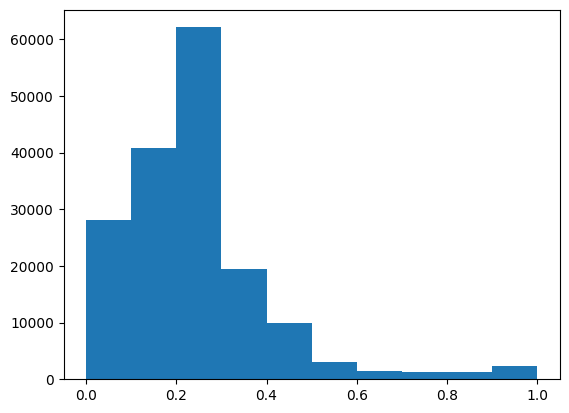

In [ ]:
plt.hist(Data['pm25'])

(array([7.0000e+00, 0.0000e+00, 0.0000e+00, 1.0000e+01, 1.0000e+00,
        4.9960e+03, 3.3667e+04, 4.8191e+04, 6.3504e+04, 1.9623e+04]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <BarContainer object of 10 artists>)

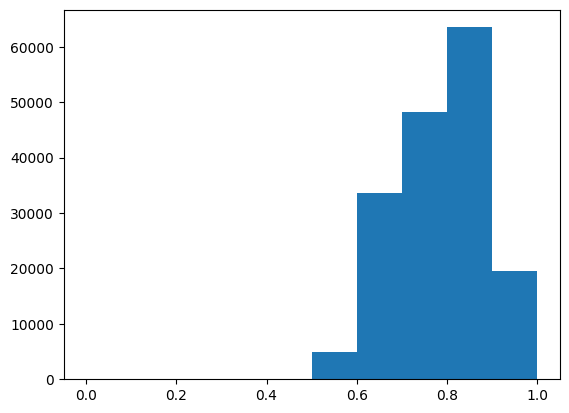

In [ ]:
plt.hist(Data['temperature'])

(array([  108.,     0.,  4153., 29816., 32995., 34140., 28559., 23894.,
        12885.,  3449.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <BarContainer object of 10 artists>)

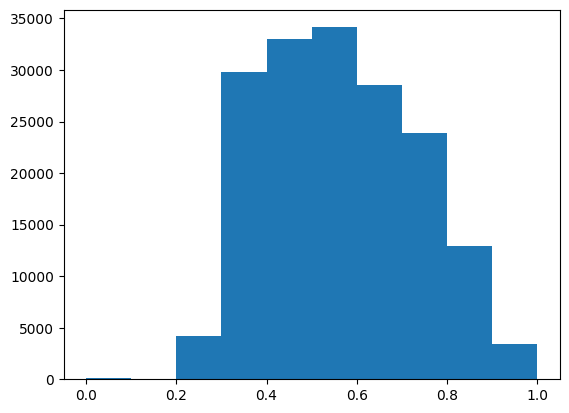

In [ ]:
plt.hist(Data['humidity'])

##### Time Series

###### Humidity vs PM values

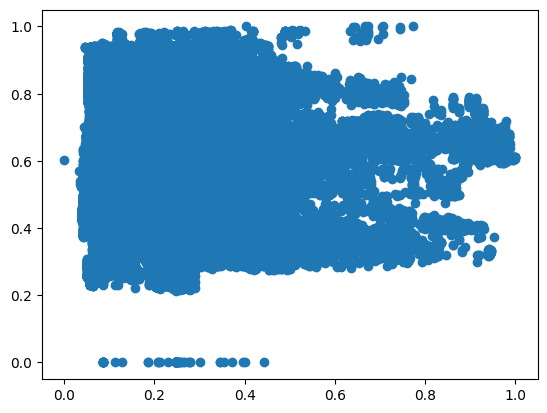

In [ ]:
plt.scatter(Data['pm25'], Data['humidity'])

###### Temperature vs PM values

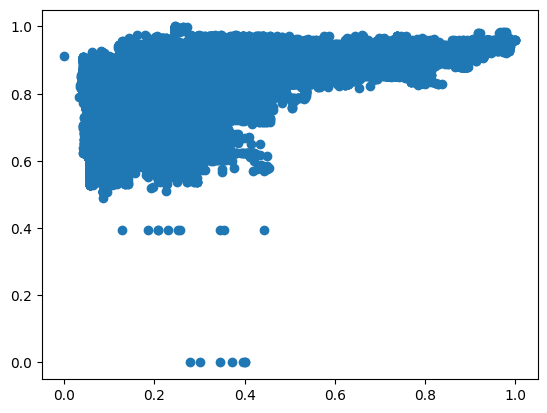

In [ ]:
plt.scatter(Data['pm25'], Data['temperature'])

##### Maps

In [ ]:
import folium
from folium.plugins import HeatMap

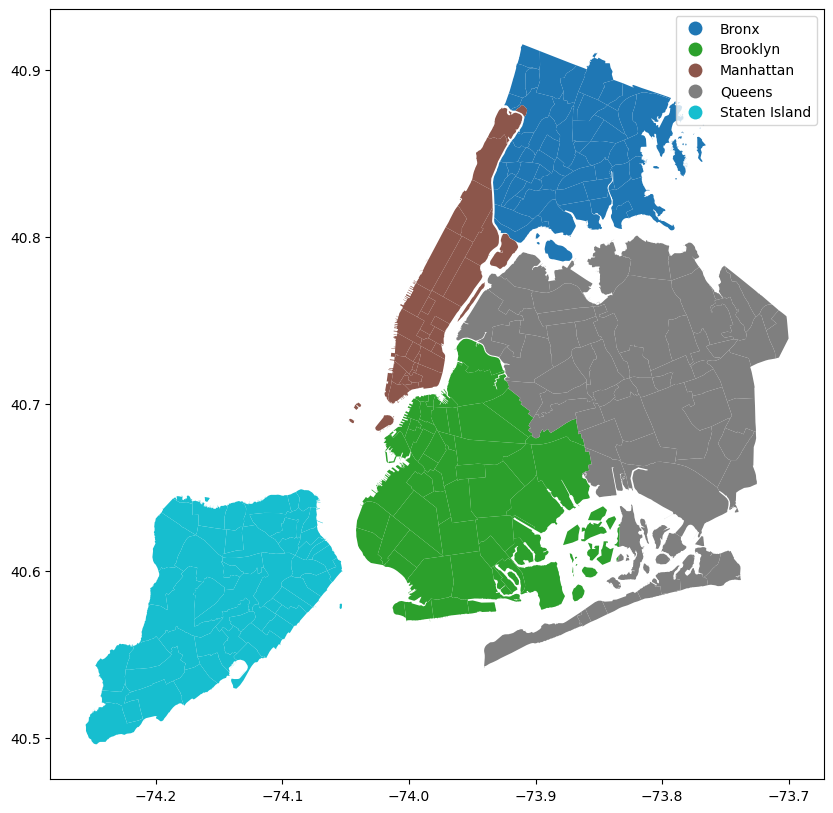

In [ ]:
sMap = geo_json_file.plot(column='borough', legend=True, figsize=(10, 10))
# plt.title('NYC Neighborhoods by Borough')
# plt.show()


In [ ]:
from geopandas.tools import sjoin

# Storing air quality data into a GeoDataFrame
gdf_air_quality = gpd.GeoDataFrame(
    Data,
    geometry=gpd.points_from_xy(Data.longitude, Data.latitude)
)

# Performing spatial join
merged_data = sjoin(gdf_air_quality, geo_json_file, how='inner', op='within')


/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py:3473: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if (await self.run_code(code, result,  async_=asy)):
<ipython-input-23-87944c55394d>:10: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: None
Right CRS: EPSG:4326

  merged_data = sjoin(gdf_air_quality, geo_json_file, how='inner', op='within')


In [ ]:
merged_data

,SensorID,time,latitude,longitude,bin0,bin1,bin2,bin3,bin4,bin5,...,bin23,temperature,humidity,pm25,geometry,index_right,neighborhood,boroughCode,borough,@id
0,NYCP2_CS01A,2021-09-10 12:35:04,40.847672,-73.869316,0.001765,0.000401,0.003279,0.000000,0.0,0.000000,...,0.0,0.874640,0.573,0.263095,POINT (-73.86932 40.84767),38,Bronx Park,2,Bronx,http://nyc.pediacities.com/Resource/Neighborho...
1,NYCP2_CS01A,2021-09-10 12:35:08,40.847668,-73.869316,0.003530,0.001604,0.003279,0.000000,0.0,0.021739,...,0.0,0.874640,0.578,0.348422,POINT (-73.86932 40.84767),38,Bronx Park,2,Bronx,http://nyc.pediacities.com/Resource/Neighborho...
2,NYCP2_CS01A,2021-09-10 12:35:13,40.847649,-73.869362,0.006417,0.000401,0.003279,0.000000,0.0,0.010870,...,0.0,0.874640,0.578,0.320904,POINT (-73.86936 40.84765),38,Bronx Park,2,Bronx,http://nyc.pediacities.com/Resource/Neighborho...
3,NYCP2_CS01A,2021-09-10 12:35:18,40.847649,-73.869362,0.004171,0.000401,0.000000,0.000000,0.0,0.000000,...,0.0,0.873199,0.576,0.263095,POINT (-73.86936 40.84765),38,Bronx Park,2,Bronx,http://nyc.pediacities.com/Resource/Neighborho...
4,NYCP2_CS01A,2021-09-10 12:35:23,40.847649,-73.869362,0.007059,0.001604,0.000000,0.009434,0.0,0.000000,...,0.0,0.873199,0.575,0.355319,POINT (-73.86936 40.84765),38,Bronx Park,2,Bronx,http://nyc.pediacities.com/Resource/Neighborho...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
161398,NYCP2_CS02A,2021-10-29 18:17:24,40.829147,-73.931694,0.000321,0.000000,0.000000,0.000000,0.0,0.000000,...,0.0,0.757925,0.637,0.165815,POINT (-73.93169 40.82915),131,Highbridge,2,Bronx,http://nyc.pediacities.com/Resource/Neighborho...
161454,NYCP2_CS02A,2021-11-11 22:54:17,40.858864,-73.922646,0.000160,0.000000,0.000000,0.000000,0.0,0.000000,...,0.0,0.768012,0.657,0.064764,POINT (-73.92265 40.85886),141,Inwood,1,Manhattan,http://nyc.pediacities.com/Resource/Neighborho...
161455,NYCP2_CS02A,2021-11-11 22:54:37,40.854622,-73.923546,0.000160,0.000000,0.000000,0.000000,0.0,0.000000,...,0.0,0.763689,0.671,0.071516,POINT (-73.92355 40.85462),295,Washington Heights,1,Manhattan,http://nyc.pediacities.com/Resource/Neighborho...
161459,NYCP2_CS02A,2021-11-14 01:29:46,40.839794,-73.848595,0.000160,0.000000,0.000000,0.000000,0.0,0.000000,...,0.0,0.646974,0.560,0.169664,POINT (-73.84860 40.83979),299,Westchester Square,2,Bronx,http://nyc.pediacities.com/Resource/Neighborho...


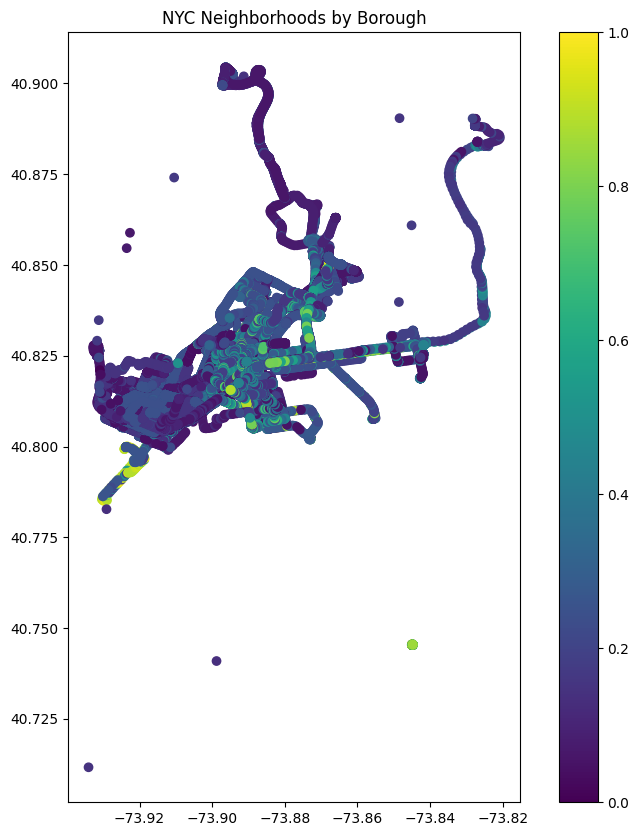

In [ ]:
merged_data.plot(column='pm25', legend=True, figsize=(10, 10))
plt.title('NYC Neighborhoods by Borough')
plt.show()


In [ ]:
average_latitude = merged_data['latitude'].mean()
average_longitude = merged_data['longitude'].mean()

m = folium.Map(location=[average_latitude, average_longitude], zoom_start=11)

In [ ]:
HeatMap(data=merged_data[['latitude', 'longitude', 'pm25']].dropna(), radius=25).add_to(m)

In [ ]:
m

## Task 1

**We used geohash for sampling instead of raw longitude and latitude to efficiently transform these coordinates into a categorical format that easily segments the geographic space into well-defined, manageable areas. This categorical representation simplifies grouping and stratification processes, ensuring that each sampled area is geographically representative without the complexities of handling continuous spatial data.**

In [ ]:
# Defining geohash precision
precision = 5

# Creating a geohash column based on longitude and latitude
data['geohash'] = data.apply(lambda x: geohash2.encode(x.latitude, x.longitude, precision=precision), axis=1)

In [ ]:
def sample_and_cluster(data, sampling_fraction, eps_km, min_samples):
    # Stratified sampling
    sampled_data = data.groupby('geohash').apply(lambda x: x.sample(frac=sampling_fraction, random_state=42)).reset_index(drop=True)

    # Convert coordinates to radians for clustering
    coords = np.radians(sampled_data[['latitude', 'longitude']].values)

    # DBSCAN clustering
    kms_per_radian = 6371.0088  # Earth radius in kilometers
    epsilon = eps_km / kms_per_radian
    db = DBSCAN(eps=epsilon, min_samples=min_samples, algorithm='ball_tree', metric='haversine').fit(coords)
    sampled_data['cluster'] = db.labels_

    num_clusters = len(set(db.labels_)) - (1 if -1 in set(db.labels_) else 0)
    print(f'Number of clusters formed: {num_clusters}')

    return sampled_data, coords

In [ ]:
def visualize_clusters(data):
    plt.figure(figsize=(10, 6))
    plt.scatter(data['longitude'], data['latitude'], c=data['cluster'], cmap='viridis', alpha=0.6)
    plt.colorbar()
    plt.title('DBSCAN Clustering of PM2.5 Readings')
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    plt.show()

In [ ]:
def calculate_silhouette(coords, labels):
    if len(np.unique(labels)) > 1:
        scaler = StandardScaler()
        scaled_coords = scaler.fit_transform(coords[labels != -1])
        return silhouette_score(scaled_coords, labels[labels != -1])
    return None

**DBSCAN Parameters:**
<br>
`eps (epsilon)`: This is the maximum distance between two samples for them to be considered as in the same neighborhood. A small eps value may lead to the data being considered as noise, and a large eps might merge distinct clusters.
<br>
`min_samples`: This is the minimum number of points required to form a dense region, which DBSCAN treats as a cluster. A lower value makes it easier to form a cluster.

In [ ]:
kms_per_radian = 6371.0088  # Earth radius in kilometers

#### `eps = 0.1` and `min_samples = 15`

In [ ]:
# Defining parameters for DBSCAN
sampling_fractions = [0.1, 0.2, 0.3]
eps_km = 0.1  # Epsilon in kilometers
min_samples = 15  # Minimum number of samples to form a cluster

Analyzing for Sampling Fraction: 0.1
Number of clusters formed: 24


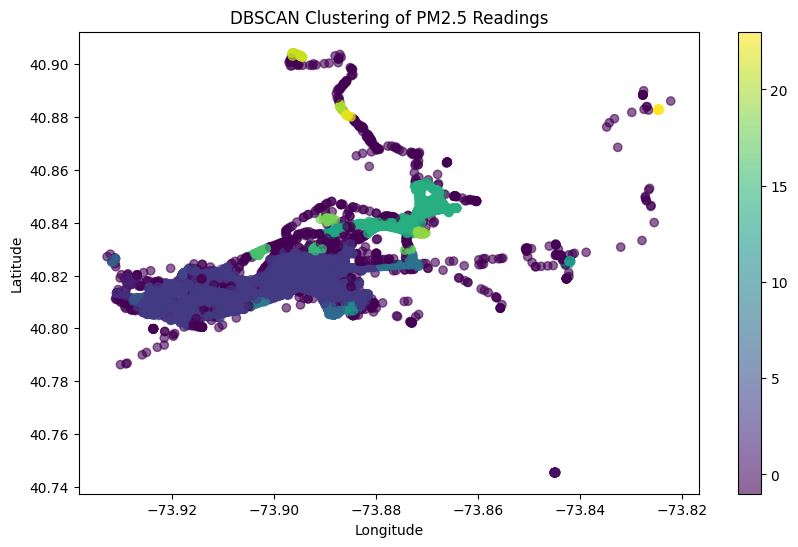

Analyzing for Sampling Fraction: 0.2
Number of clusters formed: 30


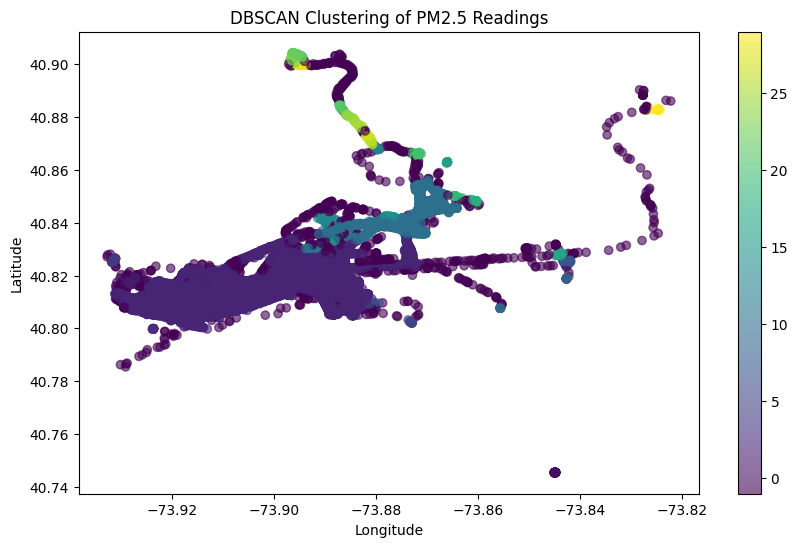

Analyzing for Sampling Fraction: 0.3
Number of clusters formed: 32


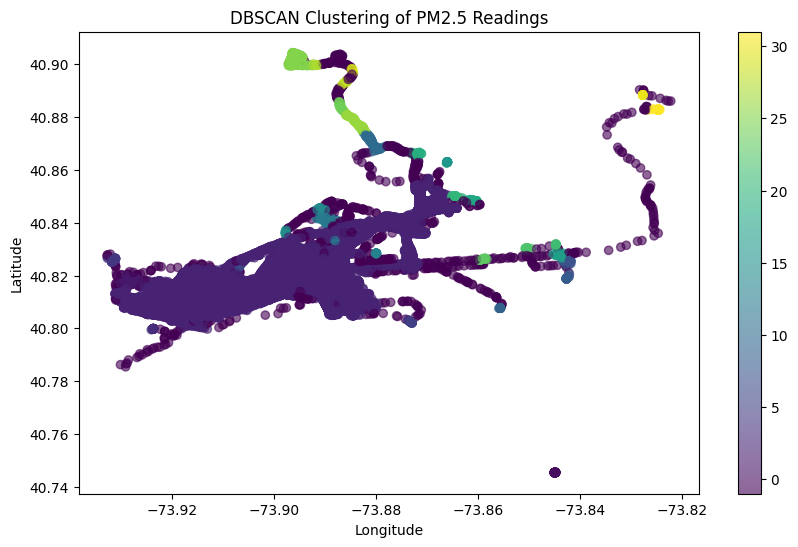

In [ ]:
silhouette_scores = []
fraction_sizes = []

# Perform analysis for each sampling fraction
for fraction in sampling_fractions:
    print(f"Analyzing for Sampling Fraction: {fraction}")
    stratified_sample, coords = sample_and_cluster(data, fraction, eps_km, min_samples)
    sil_score = calculate_silhouette(coords, stratified_sample['cluster'])
    if sil_score is not None:
        silhouette_scores.append(sil_score)
        fraction_sizes.append(fraction)
    visualize_clusters(stratified_sample)

In [ ]:
silhouette_scores

[-0.012398259624355068, -0.0022766819419331695, -0.5829902897358943]

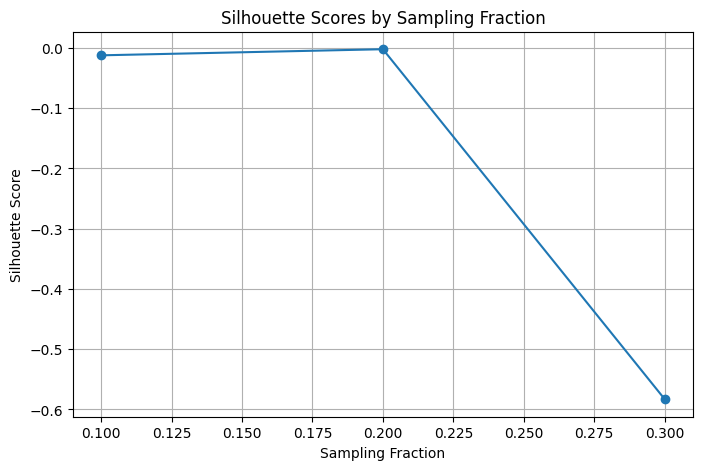

In [ ]:
# Plotting silhouette scores against sampling fractions
plt.figure(figsize=(8, 5))
plt.plot(fraction_sizes, silhouette_scores, marker='o', linestyle='-')
plt.title('Silhouette Scores by Sampling Fraction')
plt.xlabel('Sampling Fraction')
plt.ylabel('Silhouette Score')
plt.grid(True)
plt.show()

#### `eps = 0.5` and `min_samples = 20`

In [ ]:
# Defining parameters for DBSCAN
sampling_fractions = [0.1, 0.2, 0.3]
eps_km = 0.5  # Epsilon in kilometers
min_samples = 20  # Minimum number of samples to form a cluster

Analyzing for Sampling Fraction: 0.1
Number of clusters formed: 6


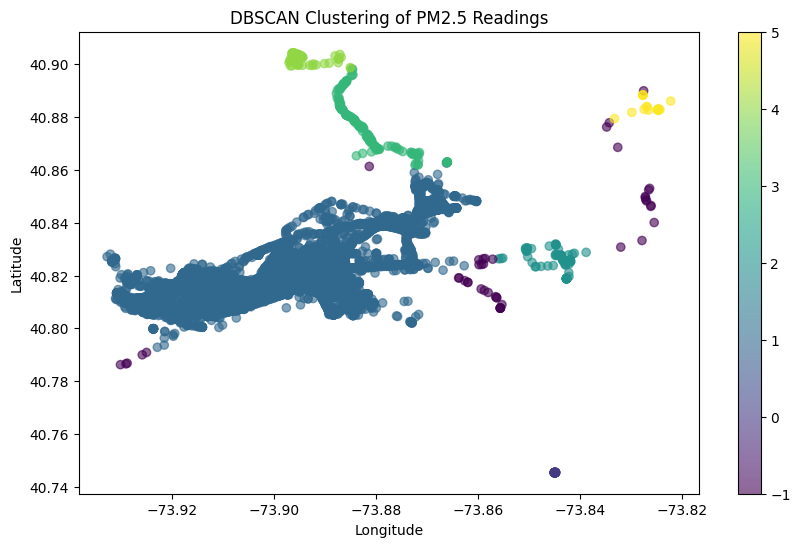

Analyzing for Sampling Fraction: 0.2
Number of clusters formed: 4


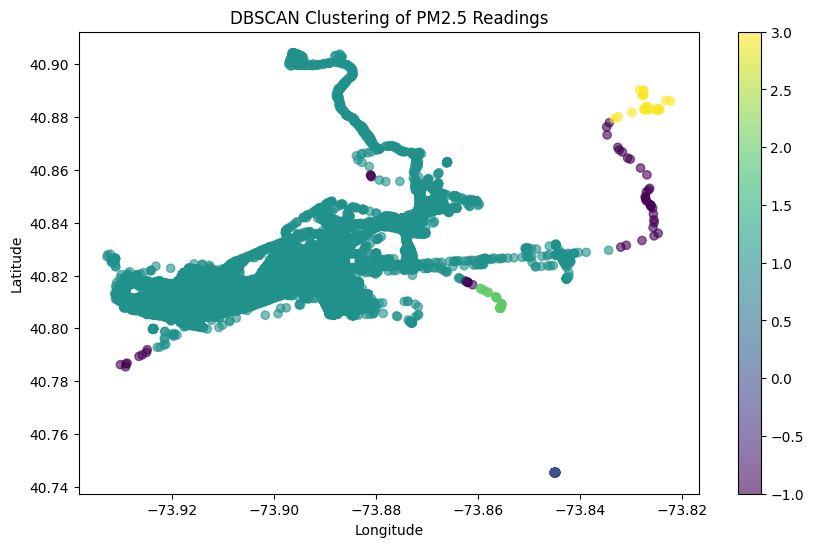

Analyzing for Sampling Fraction: 0.3
Number of clusters formed: 4


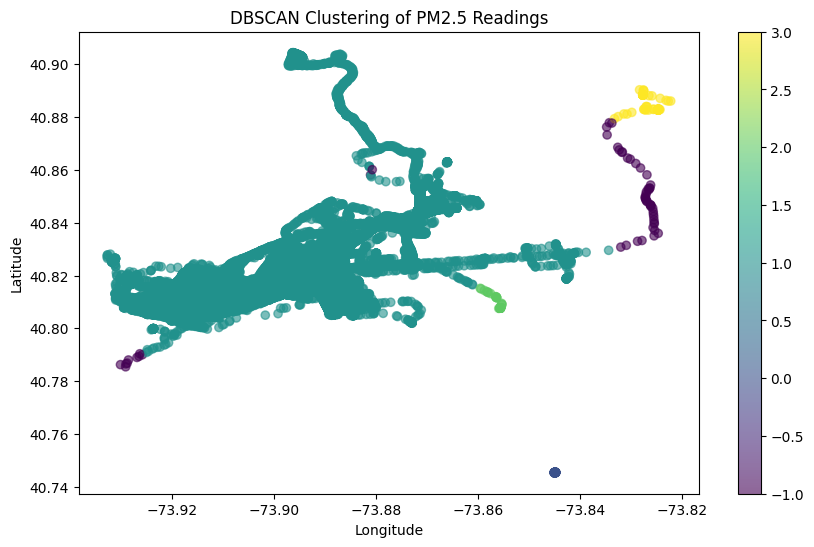

In [ ]:
silhouette_scores = []
fraction_sizes = []

# Perform analysis for each sampling fraction
for fraction in sampling_fractions:
    print(f"Analyzing for Sampling Fraction: {fraction}")
    stratified_sample, coords = sample_and_cluster(data, fraction, eps_km, min_samples)
    sil_score = calculate_silhouette(coords, stratified_sample['cluster'])
    if sil_score is not None:
        silhouette_scores.append(sil_score)
        fraction_sizes.append(fraction)
    visualize_clusters(stratified_sample)

In [ ]:
silhouette_scores

[0.38117154411720267, 0.32226728268071114, 0.3229273543509391]

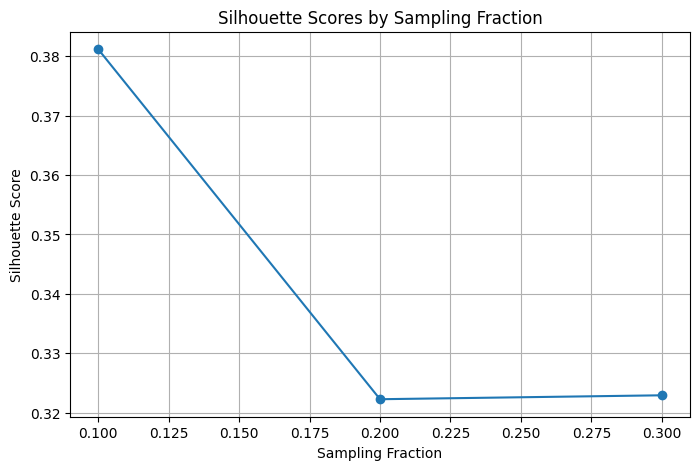

In [ ]:
# Plotting silhouette scores against sampling fractions
plt.figure(figsize=(8, 5))
plt.plot(fraction_sizes, silhouette_scores, marker='o', linestyle='-')
plt.title('Silhouette Scores by Sampling Fraction')
plt.xlabel('Sampling Fraction')
plt.ylabel('Silhouette Score')
plt.grid(True)
plt.show()

#### `eps = 1` and `min_samples = 15`

In [ ]:
# Defining parameters for DBSCAN
sampling_fractions = [0.1, 0.2, 0.3]
eps_km = 1  # Epsilon in kilometers
min_samples = 15  # Minimum number of samples to form a cluster

Analyzing for Sampling Fraction: 0.1
Number of clusters formed: 3


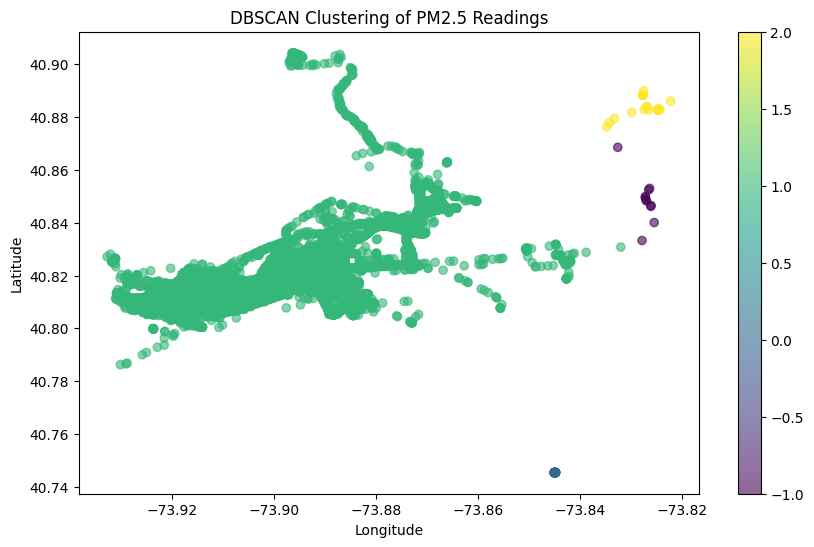

Analyzing for Sampling Fraction: 0.2
Number of clusters formed: 4


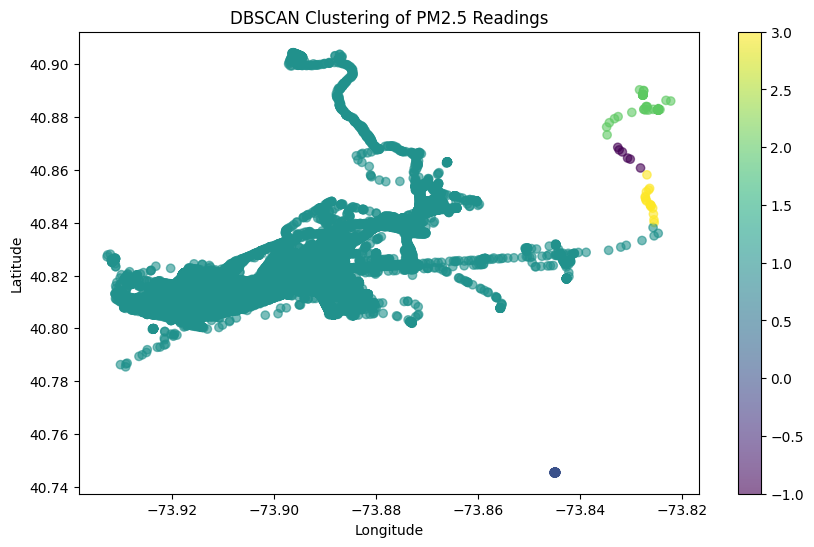

Analyzing for Sampling Fraction: 0.3
Number of clusters formed: 3


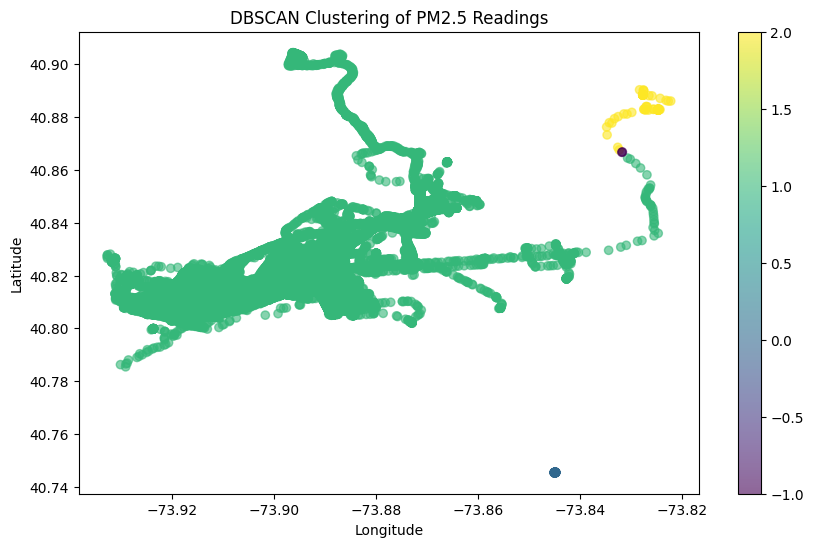

In [ ]:
silhouette_scores = []
fraction_sizes = []

# Perform analysis for each sampling fraction
for fraction in sampling_fractions:
    print(f"Analyzing for Sampling Fraction: {fraction}")
    stratified_sample, coords = sample_and_cluster(data, fraction, eps_km, min_samples)
    sil_score = calculate_silhouette(coords, stratified_sample['cluster'])
    if sil_score is not None:
        silhouette_scores.append(sil_score)
        fraction_sizes.append(fraction)
    visualize_clusters(stratified_sample)

In [ ]:
silhouette_scores

[0.6097268271912109, 0.5108939947691603, 0.6091487708059602]

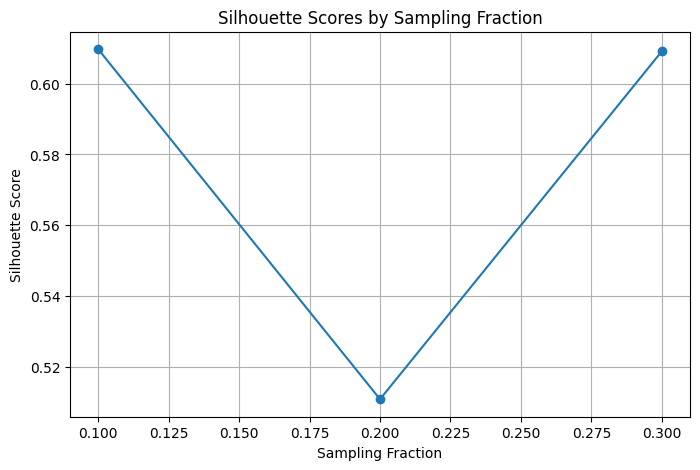

In [ ]:
# Plotting silhouette scores against sampling fractions
plt.figure(figsize=(8, 5))
plt.plot(fraction_sizes, silhouette_scores, marker='o', linestyle='-')
plt.title('Silhouette Scores by Sampling Fraction')
plt.xlabel('Sampling Fraction')
plt.ylabel('Silhouette Score')
plt.grid(True)
plt.show()

## Task 2

In [ ]:
# Calculating original and sample averages of PM2.5 concentrations per geohash
original_averages = data.groupby('geohash')['pm25'].mean()
sample_averages = stratified_sample.groupby('geohash')['pm25'].mean()

print(f"Original averages count: {original_averages.count()}")
print(f"Sample averages count: {sample_averages.count()}")

Original averages count: 13
Sample averages count: 11


In [ ]:
# Aligning the indices of both DataFrames for proper comparison
sample_averages = sample_averages.reindex(original_averages.index, fill_value=np.nan)
original_averages = original_averages.reindex(sample_averages.index, fill_value=np.nan)

# Calculating RMSE and MAPE where indices have valid data
valid_mask = ~original_averages.isna() & ~sample_averages.isna()
rmse = np.sqrt(mean_squared_error(original_averages[valid_mask], sample_averages[valid_mask]))
mape = np.mean(np.abs((original_averages[valid_mask] - sample_averages[valid_mask]) / original_averages[valid_mask])) * 100

print("RMSE:", rmse)
print("MAPE:", mape)

RMSE: 0.06568683382667881
MAPE: 0.961484369754826


In [ ]:
# Identifying top-N neighborhoods based on PM2.5 concentrations
N = 5
top_n_sample = sample_averages.sort_values(ascending=False).head(N)
top_n_original = original_averages.sort_values(ascending=False).head(N)

print(f"Top 5 neighborhoods based on PM2.5 concentrations in the sample: {top_n_sample}\n")
print(f"Top 5 neighborhoods based on PM2.5 concentrations in the sample: {top_n_original}")

Top 5 neighborhoods based on PM2.5 concentrations in the sample: geohash
dr5rz    10.716426
dr782     4.860322
dr72p     4.735994
dr72q     4.523517
dr788     4.445175
Name: pm25, dtype: float64

Top 5 neighborhoods based on PM2.5 concentrations in the sample: geohash
dr5rz    10.623927
dr782     4.908958
dr72p     4.821123
dr72q     4.526557
dr72n     4.400401
Name: pm25, dtype: float64


In [ ]:
# Computing Pearson Correlation and Jensen Shannon Divergence for top-N neighborhoods
correlation = top_n_sample.corr(top_n_original, method='pearson')

prob_data = top_n_sample / top_n_sample.sum()
prob_original = top_n_original / top_n_original.sum()
js_divergence = jensenshannon(prob_data, prob_original)

print("Pearson Correlation:", correlation)
print("Jensen Shannon Divergence:", js_divergence)

Pearson Correlation: 0.9999259288826505
Jensen Shannon Divergence: 0.0037293795019193027


### QoS

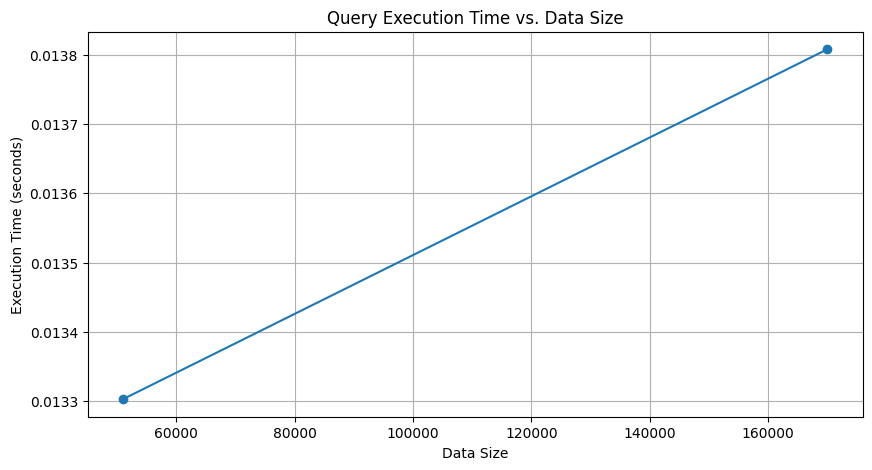

In [ ]:
# Measure the execution times for computing average PM2.5 per geohash on the full dataset and the stratified sample
start_time_full = time.time()
avg_pm25_full = data.groupby('geohash')['pm25'].mean()
end_time_full = time.time()

start_time_sample = time.time()
avg_pm25_sample = stratified_sample.groupby('geohash')['pm25'].mean()
end_time_sample = time.time()

execution_time_full = end_time_full - start_time_full
execution_time_sample = end_time_sample - start_time_sample

# Plotting execution times
sizes = [len(data), len(stratified_sample)]
times = [execution_time_full, execution_time_sample]

plt.figure(figsize=(10, 5))
plt.plot(sizes, times, marker='o')
plt.title('Query Execution Time vs. Data Size')
plt.xlabel('Data Size')
plt.ylabel('Execution Time (seconds)')
plt.grid(True)
plt.show()

## Task 3

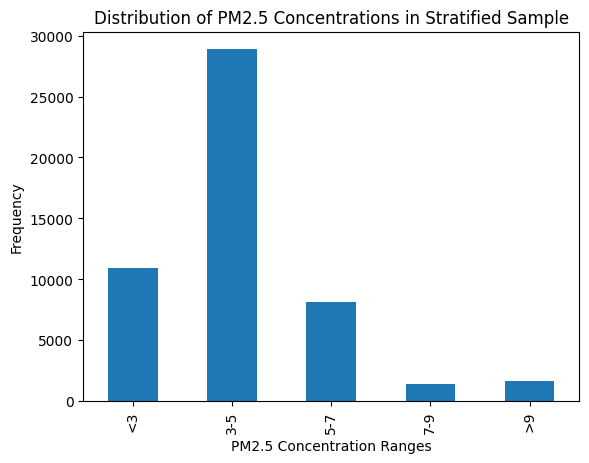

In [ ]:
pm25_ranges = [0, 3, 5, 7, 9, float('inf')]
labels = ['<3', '3-5', '5-7', '7-9', '>9']

stratified_sample['pm25_category'] = pd.cut(stratified_sample['pm25'], bins=pm25_ranges, labels=labels)
pm25_histogram = stratified_sample['pm25_category'].value_counts().sort_index()

pm25_histogram.plot(kind='bar')
plt.xlabel('PM2.5 Concentration Ranges')
plt.ylabel('Frequency')
plt.title('Distribution of PM2.5 Concentrations in Stratified Sample')
plt.show()

Cluster Labels:<br>
`Positive integers (0, 1, 2, 3, 4, etc.)`: Each distinct positive integer represents a separate cluster. The DBSCAN algorithm has identified these groups of points as being sufficiently dense according to the eps and min_samples parameters. Each cluster is a group of points that are close enough to each other to meet these density criteria. Essentially, all points within the same cluster are within the eps radius of at least one other point in the cluster (and often several points).<br>
`-1`: This label represents noise. These are points that do not belong to any cluster. In the DBSCAN framework, noise points are those that do not have enough neighboring points within the eps radius to qualify as a core point, nor are they close enough to core points to be considered as part of a cluster. Essentially, these points are too isolated when considering the defined neighborhood size and density requirement.

In [ ]:
def prepare_and_cluster(data, fraction, eps, min_samples):
    """Performing stratified sampling, scaling features, and running DBSCAN clustering.
    Returning clustered data and silhouette score, and printing the number of clusters formed."""
    # Stratified sampling based on geohash and fraction size
    sampled_data = data.groupby('geohash').sample(frac=fraction, random_state=42).reset_index(drop=True)

    # Scaling features for clustering
    scaler = StandardScaler()
    features = sampled_data[['latitude', 'longitude', 'pm25']]
    features_scaled = scaler.fit_transform(features)

    # Running DBSCAN with specified parameters
    db = DBSCAN(eps=eps, min_samples=min_samples)
    labels = db.fit_predict(features_scaled)
    sampled_data['cluster'] = labels

    # Counting unique clusters
    num_clusters = len(set(labels)) - (1 if -1 in set(labels) else 0)  # Adjust for noise represented by label -1
    print(f'Number of clusters formed for fraction {fraction}: {num_clusters}')

    # Calculating silhouette score if more than one cluster is identified
    if num_clusters > 1:
        sil_score = silhouette_score(features_scaled, labels)
    else:
        sil_score = None  # No valid score if there's only one cluster or none

    return sampled_data, sil_score


In [ ]:
def analyze_clusters(sample, labels):
    """Analyzing and printing the mean PM2.5 concentrations within each cluster and calculating silhouette score."""
    sample['cluster'] = labels
    num_clusters = len(set(labels))
    print(f'Number of clusters formed: {num_clusters}')
    cluster_means = sample.groupby('cluster')['pm25'].mean()
    print(cluster_means)
    if num_clusters > 1:
        sil_score = silhouette_score(sample[['latitude', 'longitude', 'pm25']], labels)
        print("Silhouette Score: {:.2f}".format(sil_score))
    else:
        print("Silhouette score requires at least two clusters to be meaningful.")
    return cluster_means

In [ ]:
def plot_clusters(sample):
    """Visualizing the clusters."""
    plt.scatter(sample['longitude'], sample['latitude'], c=sample['cluster'], cmap='viridis', alpha=0.5)
    plt.colorbar()
    plt.title('DBSCAN Clustering of Stratified Sample')
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    plt.show()

`Testing different DBSCAN parameters`:

#### `eps = 0.1` and `min_samples = 15`

In [ ]:
# Defining parameters for DBSCAN
sampling_fractions = [0.1, 0.2, 0.3]
eps = 0.1
min_samples = 15

Number of clusters formed for fraction 0.1: 54
Results for fraction size: 0.1


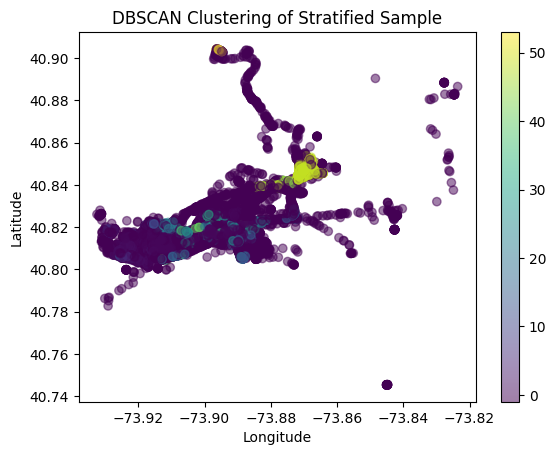

Number of clusters formed for fraction 0.2: 78
Results for fraction size: 0.2


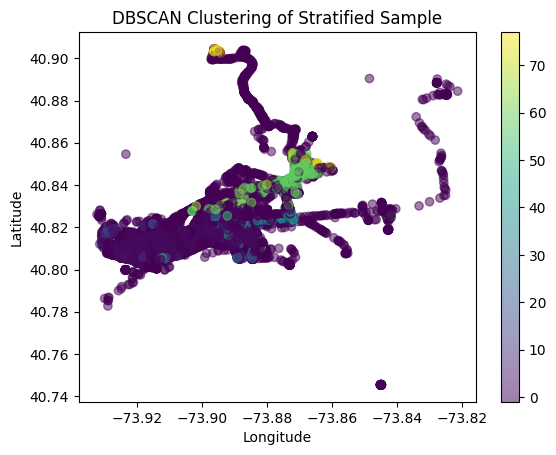

Number of clusters formed for fraction 0.3: 86
Results for fraction size: 0.3


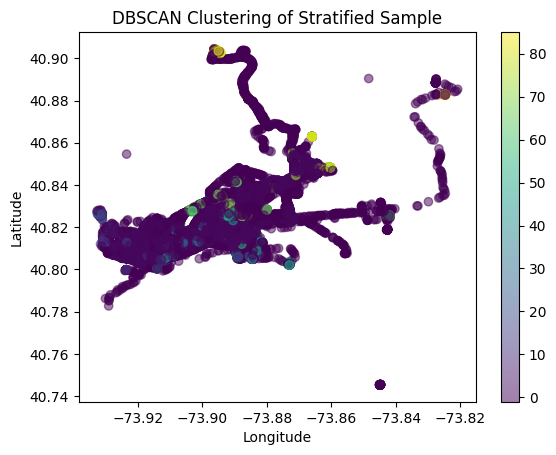

In [ ]:
silhouette_scores = []
for fraction in fraction_sizes:
    clustered_data, sil_score = prepare_and_cluster(data, fraction, eps, min_samples)
    silhouette_scores.append(sil_score)
    print(f"Results for fraction size: {fraction}")
    plot_clusters(clustered_data)

In [ ]:
silhouette_scores

[-0.45310293767668763, -0.47379840997932754, -0.6450217603054245]

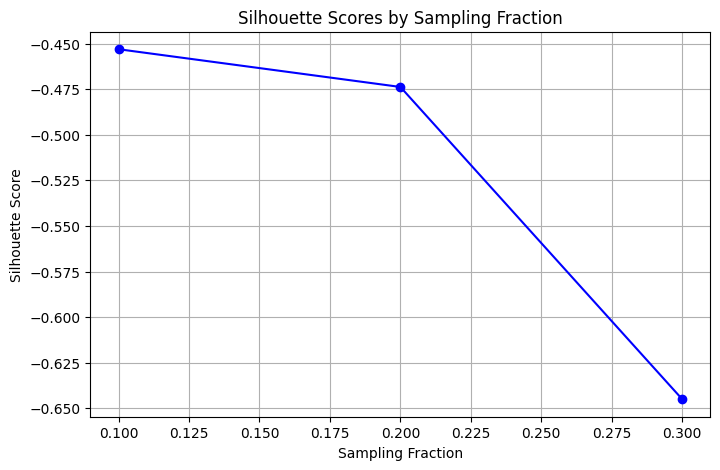

In [ ]:
# Plotting silhouette scores
plt.figure(figsize=(8, 5))
plt.plot(fraction_sizes, silhouette_scores, marker='o', linestyle='-', color='blue')
plt.title('Silhouette Scores by Sampling Fraction')
plt.xlabel('Sampling Fraction')
plt.ylabel('Silhouette Score')
plt.grid(True)
plt.show()

#### `eps = 0.5` and `min_samples = 20`

In [ ]:
# Defining parameters for DBSCAN
sampling_fractions = [0.1, 0.2, 0.3]
eps = 0.5
min_samples = 20

Number of clusters formed for fraction 0.1: 5
Results for fraction size: 0.1


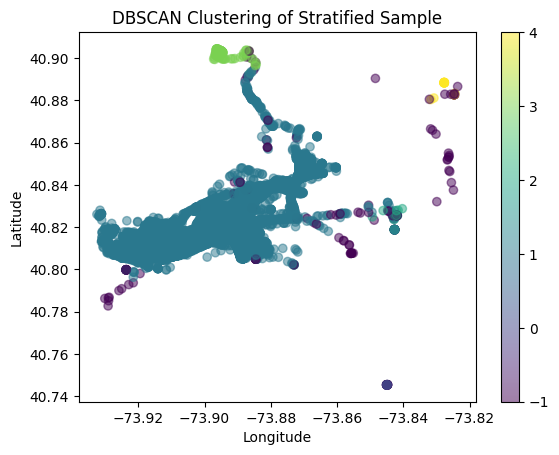

Number of clusters formed for fraction 0.2: 5
Results for fraction size: 0.2


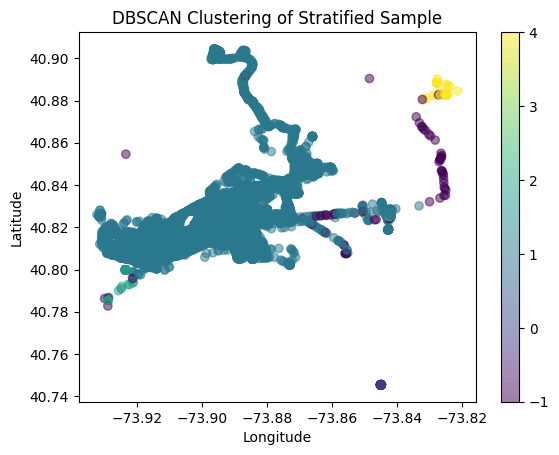

Number of clusters formed for fraction 0.3: 3
Results for fraction size: 0.3


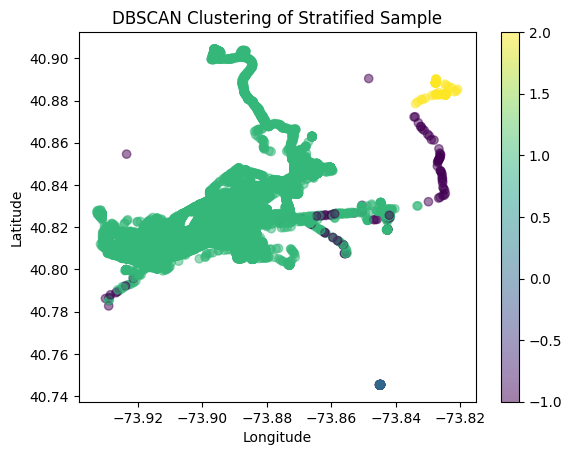

In [ ]:
silhouette_scores = []
for fraction in fraction_sizes:
    clustered_data, sil_score = prepare_and_cluster(data, fraction, eps, min_samples)
    silhouette_scores.append(sil_score)
    print(f"Results for fraction size: {fraction}")
    plot_clusters(clustered_data)

In [ ]:
silhouette_scores

[0.3604967229132943, 0.4155451402211038, 0.4593567577054559]

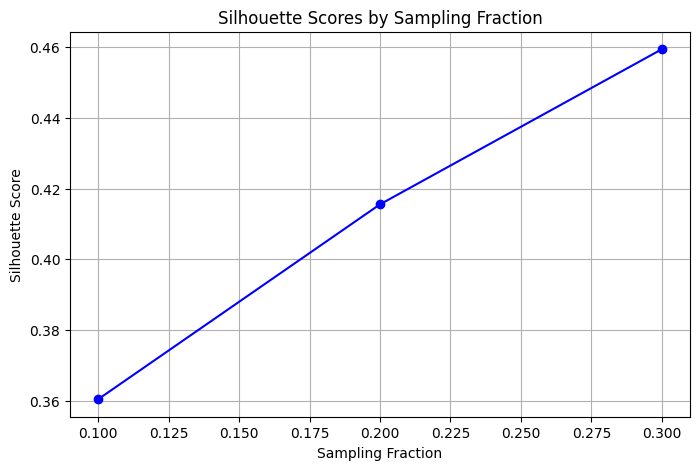

In [ ]:
# Plotting silhouette scores
plt.figure(figsize=(8, 5))
plt.plot(fraction_sizes, silhouette_scores, marker='o', linestyle='-', color='blue')
plt.title('Silhouette Scores by Sampling Fraction')
plt.xlabel('Sampling Fraction')
plt.ylabel('Silhouette Score')
plt.grid(True)
plt.show()

#### `eps = 1` and `min_samples = 15`

In [ ]:
# Defining parameters for DBSCAN
sampling_fractions = [0.1, 0.2, 0.3]
eps = 1
min_samples = 15

Number of clusters formed for fraction 0.1: 3
Results for fraction size: 0.1


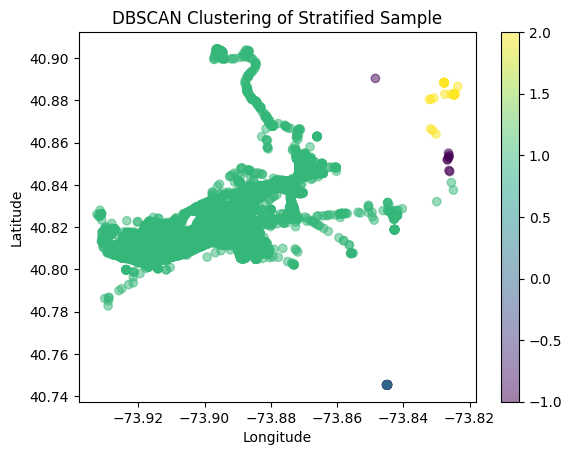

Number of clusters formed for fraction 0.2: 4
Results for fraction size: 0.2


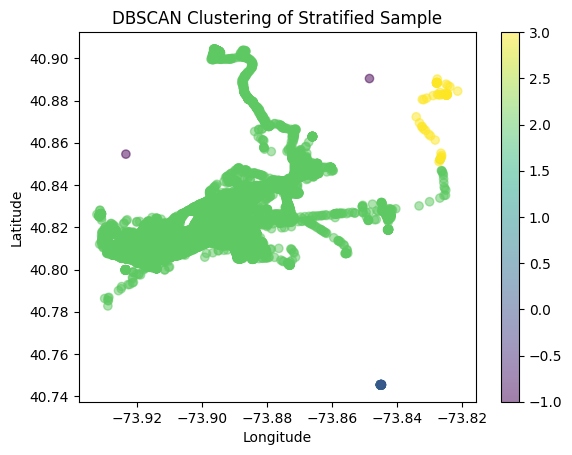

Number of clusters formed for fraction 0.3: 2
Results for fraction size: 0.3


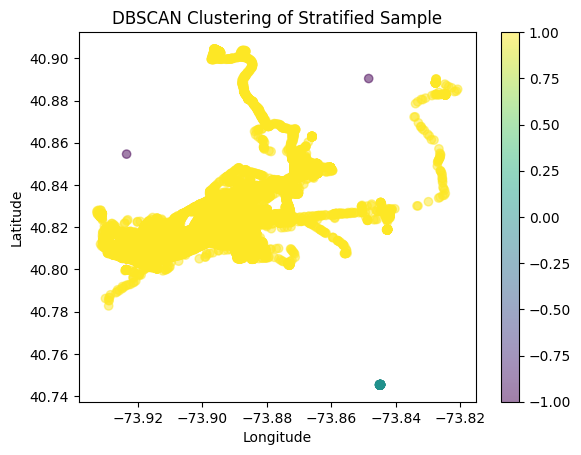

In [ ]:
silhouette_scores = []
for fraction in fraction_sizes:
    clustered_data, sil_score = prepare_and_cluster(data, fraction, eps, min_samples)
    silhouette_scores.append(sil_score)
    print(f"Results for fraction size: {fraction}")
    plot_clusters(clustered_data)

In [ ]:
silhouette_scores

[0.507361127906569, 0.4226087912479846, 0.4225954486478476]

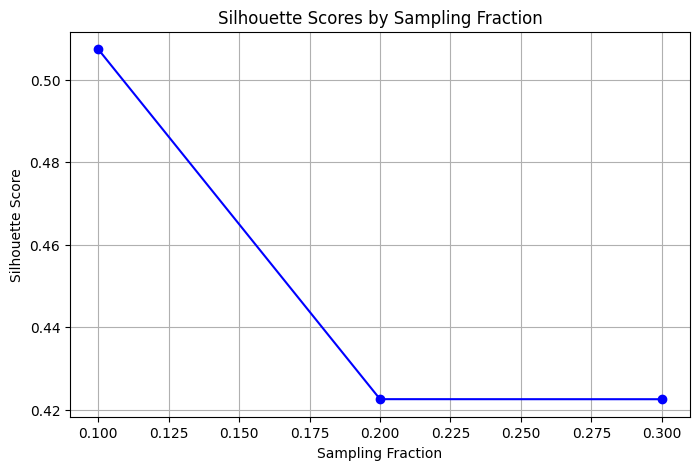

In [ ]:
# Plotting silhouette scores
plt.figure(figsize=(8, 5))
plt.plot(fraction_sizes, silhouette_scores, marker='o', linestyle='-', color='blue')
plt.title('Silhouette Scores by Sampling Fraction')
plt.xlabel('Sampling Fraction')
plt.ylabel('Silhouette Score')
plt.grid(True)
plt.show()